In [0]:
%sh
apt-get install -y graphviz

Reading package lists...
Building dependency tree...
Reading state information...
The following additional packages will be installed:
  fonts-liberation libann0 libcdt5 libcgraph6 libgts-0.7-5 libgts-bin libgvc6
  libgvpr2 liblab-gamut1 libpathplan4
Suggested packages:
  graphviz-doc
The following NEW packages will be installed:
  fonts-liberation graphviz libann0 libcdt5 libcgraph6 libgts-0.7-5 libgts-bin
  libgvc6 libgvpr2 liblab-gamut1 libpathplan4
0 upgraded, 11 newly installed, 0 to remove and 24 not upgraded.
Need to get 2701 kB of archives.
After this operation, 11.3 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/main amd64 fonts-liberation all 1:1.07.4-11 [822 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal/universe amd64 libann0 amd64 1.1.2+doc-7build1 [26.0 kB]
Get:3 http://archive.ubuntu.com/ubuntu focal/universe amd64 libcdt5 amd64 2.42.2-3build2 [18.7 kB]
Get:4 http://archive.ubuntu.com/ubuntu focal/universe amd64 libcgraph6 amd64 

In [0]:
%sh
pip install dtreeviz[pyspark]

  Created wheel for pyspark: filename=pyspark-3.5.0-py2.py3-none-any.whl size=317425367 sha256=cabf8315cdaf6f623289e4c3dca78676adc5fce7492a0f2618a4ba13d360117a
  Stored in directory: /root/.cache/pip/wheels/a6/ce/f9/17d82c92f044018df2fe30af63ac043447720d5b2cee39b40f
Successfully built pyspark
You should consider upgrading via the '/databricks/python3/bin/python -m pip install --upgrade pip' command.


In [0]:
from pyspark.sql.functions import col,isnan, when, count
from pyspark.sql.types import IntegerType, DoubleType
from pyspark import SparkFiles

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('seaborn')
sns.set(font_scale=2)

import warnings
warnings.filterwarnings('ignore')

In [0]:
#구글 드라이버에서 다운로드 받을 파일의 URL
url = "https://drive.google.com/uc?id=1hLyqMbl5foc96lDJk6_KWJ_RLVOtIzIJ"



In [0]:
spark.sparkContext.addFile(url)


In [0]:
SparkFiles.getRootDirectory()

Out[5]: '/local_disk0/spark-90c3618a-cde9-4623-b240-f1d0392fd75c/userFiles-579c1831-ce26-4e01-b827-5f5eb9f723be'

In [0]:
os.listdir(SparkFiles.getRootDirectory())

Out[6]: ['uc']

In [0]:
df_train = spark.read.csv("file://"+SparkFiles.get('uc'), header=True)

In [0]:
column_name_list = df_train.columns

In [0]:
int_column_list = column_name_list[1:2]+column_name_list[5:7] + column_name_list[11:12]

In [0]:
int_column_list

Out[10]: ['Pclass', 'SibSp', 'Parch', 'Survived']

In [0]:
for column_name in int_column_list:

    print("column_name = ", column_name)
    df_train = df_train.withColumn(column_name, df_train[column_name].cast('int'))
    print('='*100)

column_name =  Pclass
column_name =  SibSp
column_name =  Parch
column_name =  Survived


In [0]:
double_column_list = column_name_list[4:5] + column_name_list[8:9]

In [0]:
double_column_list

Out[13]: ['Age', 'Fare']

In [0]:
for column_name in double_column_list:

    print('column_name = ', column_name)
    df_train = df_train.withColumn(column_name, df_train[column_name].cast('double'))
    print('='*100)

column_name =  Age
column_name =  Fare


In [0]:
display(df_train.summary())

summary,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
count,891,891,891,891,714,891,891,891,891,204,889,891
mean,446.0,2.308641975308642,null,null,29.69911764705882,0.5230078563411896,0.38159371492704824,260318.54916792738,32.2042079685746,null,null,0.3838383838383838
stddev,257.3538420152301,0.8360712409770491,null,null,14.526497332334035,1.1027434322934315,0.8060572211299488,471609.26868834975,49.69342859718089,null,null,0.48659245426485753
min,1,1,"""Andersson, Mr. August Edvard (""""Wennerstrom"""")""",female,0.42,0,0,110152,0.0,A10,C,0
25%,223.0,2,null,null,20.0,0,0,19996.0,7.8958,null,null,0
50%,446.0,3,null,null,28.0,0,0,236171.0,14.4542,null,null,0
75%,669.0,3,null,null,38.0,1,0,347743.0,31.0,null,null,1
max,99,3,"van Melkebeke, Mr. Philemon",male,80.0,8,6,WE/P 5735,512.3292,T,S,1


In [0]:
### type 전처리 완료

In [0]:
psample_df = df_train.toPandas()

In [0]:
psample_df

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
0,1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,None,S,0
1,2,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C,1
2,3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,None,S,1
3,4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S,1
4,5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,None,S,0
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,None,S,0
887,888,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S,1
888,889,3,"""Johnston, Miss. Catherine Helen """"Carrie""""""",female,NaN,1,2,W./C. 6607,23.4500,None,S,0
889,890,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C,1


In [0]:
psample_df.skew()

#fare이 많이 기울어져 있

Out[19]: PassengerId    0.000000
Pclass        -0.630548
Age            0.389108
SibSp          3.695352
Parch          2.749117
Fare           4.787317
Survived       0.478523
dtype: float64

Out[20]: (array([732., 106.,  31.,   2.,  11.,   6.,   0.,   0.,   0.,   3.]),
 array([  0.     ,  51.23292, 102.46584, 153.69876, 204.93168, 256.1646 ,
        307.39752, 358.63044, 409.86336, 461.09628, 512.3292 ]),
 <BarContainer object of 10 artists>)

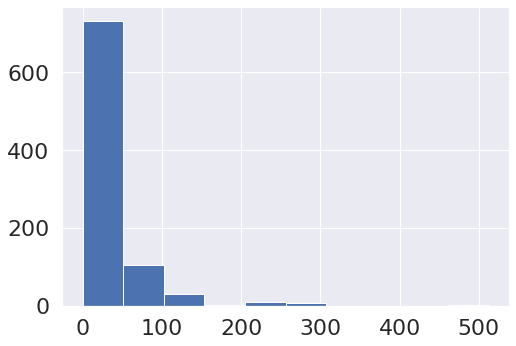

In [0]:
plt.hist(psample_df['Fare'])

In [0]:
from pyspark.sql.functions import log1p

df_train = df_train.withColumn('Fare', log1p('Fare'))

In [0]:
display(df_train) #fare값이 log로 수

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0
6,3,"Moran, Mr. James",male,null,0,0,330877,2.246892662898172,null,Q,0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1


In [0]:
psample_df = df_train.toPandas()
psample_df 

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
0,1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.110213,None,S,0
1,2,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,4.280593,C85,C,1
2,3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856,None,S,1
3,4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.990834,C123,S,1
4,5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.202765,None,S,0
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,2.639057,None,S,0
887,888,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,3.433987,B42,S,1
888,889,3,"""Johnston, Miss. Catherine Helen """"Carrie""""""",female,NaN,1,2,W./C. 6607,3.196630,None,S,0
889,890,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,3.433987,C148,C,1


In [0]:
#fare의 기울기 감소
psample_df.skew()

Out[24]: PassengerId    0.000000
Pclass        -0.630548
Age            0.389108
SibSp          3.695352
Parch          2.749117
Fare           0.394928
Survived       0.478523
dtype: float64

Out[25]: (array([ 15.,   0.,   2., 350., 167., 182.,  85.,  59.,  28.,   3.]),
 array([0.        , 0.62409174, 1.24818347, 1.87227521, 2.49636694,
        3.12045868, 3.74455041, 4.36864215, 4.99273388, 5.61682562,
        6.24091735]),
 <BarContainer object of 10 artists>)

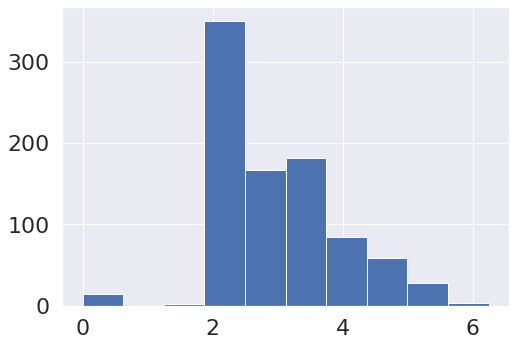

In [0]:
plt.hist(psample_df['Fare'])

In [0]:
df_train.withColumn('FamilySize', df_train['SibSp'] + df_train['Parch'] + 1 ).show()

+-----------+------+--------------------+------+----+-----+-----+----------------+------------------+-----+--------+--------+----------+
|PassengerId|Pclass|                Name|   Sex| Age|SibSp|Parch|          Ticket|              Fare|Cabin|Embarked|Survived|FamilySize|
+-----------+------+--------------------+------+----+-----+-----+----------------+------------------+-----+--------+--------+----------+
|          1|     3|Braund, Mr. Owen ...|  male|22.0|    1|    0|       A/5 21171|2.1102132003465894| null|       S|       0|         2|
|          2|     1|Cumings, Mrs. Joh...|female|38.0|    1|    0|        PC 17599|   4.2805931204649|  C85|       C|       1|         2|
|          3|     3|Heikkinen, Miss. ...|female|26.0|    0|    0|STON/O2. 3101282| 2.188856327665703| null|       S|       1|         1|
|          4|     1|Futrelle, Mrs. Ja...|female|35.0|    1|    0|          113803|3.9908341858524357| C123|       S|       1|         2|
|          5|     3|Allen, Mr. Willia...|

In [0]:
df_train = df_train.withColumn('FamilySize', df_train['SibSp'] + df_train['Parch'] + 1 )

In [0]:
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1
6,3,"Moran, Mr. James",male,null,0,0,330877,2.246892662898172,null,Q,0,1
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2


In [0]:
df_train.crosstab('FamilySize', 'Survived').show()

+-------------------+---+---+
|FamilySize_Survived|  0|  1|
+-------------------+---+---+
|                  5| 12|  3|
|                  1|374|163|
|                  6| 19|  3|
|                  2| 72| 89|
|                  7|  8|  4|
|                  3| 43| 59|
|                 11|  7|  0|
|                  8|  6|  0|
|                  4|  8| 21|
+-------------------+---+---+



In [0]:
df_train.createOrReplaceTempView('titanic_view')

#Family size 추가 확4

In [0]:
%sql
select * from titanic_view 

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1
6,3,"Moran, Mr. James",male,null,0,0,330877,2.246892662898172,null,Q,0,1
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2


In [0]:
%sql

select FamilySize, Survived, count(*)
from titanic_view 
group by FamilySize, Survived
order by Familysize, survived desc

FamilySize,Survived,count(1)
1,1,163
1,0,374
2,1,89
2,0,72
3,1,59
3,0,43
4,1,21
4,0,8
5,1,3
5,0,12


In [0]:
%sql
select Name from titanic_view

Name
"Braund, Mr. Owen Harris"
"Cumings, Mrs. John Bradley (Florence Briggs Thayer)"
"Heikkinen, Miss. Laina"
"Futrelle, Mrs. Jacques Heath (Lily May Peel)"
"Allen, Mr. William Henry"
"Moran, Mr. James"
"McCarthy, Mr. Timothy J"
"Palsson, Master. Gosta Leonard"
"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)"
"Nasser, Mrs. Nicholas (Adele Achem)"


In [0]:
# Sir 컬럼 추

In [0]:
import re

p = re.compile('Mrs|Mr|Miss|Master|Don|Dr|Ms|Major|Mlle|Mme|Countess|Lady|Don')

In [0]:
p.findall('Mr Mrs park')

Out[36]: ['Mr', 'Mrs']

In [0]:
def get_sir (name):
    if p.search(name):
        if p.search(name)[0] in ['Countess', 'Lady']:
            return 'Mrs'
        elif p.search(name)[0] in ['Mme', 'Ms', 'Mlle']:
            return 'Miss'
        
        elif p.search(name)[0] in ['Don', 'Dr', 'Major']:
            return 'Mr'
        else:
            return p.search(name)[0]
        
    else:
        return 'Other'

In [0]:
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType


In [0]:
udf_get_sir = udf(lambda x:get_sir(x), StringType())

In [0]:
df_train.withColumn('Sir', udf_get_sir(df_train['Name'])).show()

+-----------+------+--------------------+------+----+-----+-----+----------------+------------------+-----+--------+--------+----------+------+
|PassengerId|Pclass|                Name|   Sex| Age|SibSp|Parch|          Ticket|              Fare|Cabin|Embarked|Survived|FamilySize|   Sir|
+-----------+------+--------------------+------+----+-----+-----+----------------+------------------+-----+--------+--------+----------+------+
|          1|     3|Braund, Mr. Owen ...|  male|22.0|    1|    0|       A/5 21171|2.1102132003465894| null|       S|       0|         2|    Mr|
|          2|     1|Cumings, Mrs. Joh...|female|38.0|    1|    0|        PC 17599|   4.2805931204649|  C85|       C|       1|         2|   Mrs|
|          3|     3|Heikkinen, Miss. ...|female|26.0|    0|    0|STON/O2. 3101282| 2.188856327665703| null|       S|       1|         1|  Miss|
|          4|     1|Futrelle, Mrs. Ja...|female|35.0|    1|    0|          113803|3.9908341858524357| C123|       S|       1|         2|

In [0]:
df_train = df_train.withColumn('Sir', udf_get_sir(df_train['Name']))

In [0]:
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr
6,3,"Moran, Mr. James",male,null,0,0,330877,2.246892662898172,null,Q,0,1,Mr
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs


In [0]:
df_train.crosstab('Sir', 'Survived').show()

+------------+---+---+
|Sir_Survived|  0|  1|
+------------+---+---+
|       Other|  9|  1|
|      Master| 17| 23|
|          Mr|442| 88|
|         Mrs| 26|100|
|        Miss| 55|130|
+------------+---+---+



In [0]:
df_train.createOrReplaceTempView('titanic_view')

In [0]:
%sql

select * from titanic_view

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr
6,3,"Moran, Mr. James",male,null,0,0,330877,2.246892662898172,null,Q,0,1,Mr
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs


In [0]:
%sql
select sir, survived, count(*) from titanic_view group by sir, survived 
order by sir

sir,survived,count(1)
Master,0,17
Master,1,23
Miss,1,130
Miss,0,55
Mr,1,88
Mr,0,442
Mrs,0,26
Mrs,1,100
Other,0,9
Other,1,1


In [0]:
### 결측치 찾기

In [0]:
df_train.groupby('sir').mean().show()

+------+------------------+-----------------+-------------------+------------------+------------------+------------------+------------------+
|   sir|       avg(Pclass)|         avg(Age)|         avg(SibSp)|        avg(Parch)|         avg(Fare)|     avg(Survived)|   avg(FamilySize)|
+------+------------------+-----------------+-------------------+------------------+------------------+------------------+------------------+
|  Miss| 2.281081081081081|            21.86| 0.7027027027027027|0.5405405405405406|3.1923512431103003|0.7027027027027027|2.2432432432432434|
| Other|               1.6|             48.3|                0.2|               0.2|2.8486349174633236|               0.1|               1.4|
|Master|             2.625|4.574166666666667|                2.3|             1.375|  3.38136084875905|             0.575|             4.675|
|    Mr|2.3849056603773584|32.65158924205379|0.29245283018867924|0.1509433962264151|2.7281409248276858|0.1660377358490566|1.4433962264150944|
|   Mr

In [0]:
df_train[['Sir','Age']].groupby('Sir').mean().show()

+------+-----------------+
|   Sir|         avg(Age)|
+------+-----------------+
|  Miss|            21.86|
| Other|             48.3|
|Master|4.574166666666667|
|    Mr|32.65158924205379|
|   Mrs|             36.0|
+------+-----------------+



In [0]:
sir_df = df_train[['Sir','Age']].groupby('Sir').mean()

In [0]:
sir_df.withColumnRenamed('avg(Age)', 'avg_age').show()

+------+-----------------+
|   Sir|          avg_age|
+------+-----------------+
|  Miss|            21.86|
| Other|             48.3|
|Master|4.574166666666667|
|    Mr|32.65158924205379|
|   Mrs|             36.0|
+------+-----------------+



In [0]:
sir_df = sir_df.withColumnRenamed('avg(Age)', 'avg_age')

In [0]:
sir_df.show()

+------+-----------------+
|   Sir|          avg_age|
+------+-----------------+
|  Miss|            21.86|
| Other|             48.3|
|Master|4.574166666666667|
|    Mr|32.65158924205379|
|   Mrs|             36.0|
+------+-----------------+



In [0]:
sir_df.toPandas()

,Sir,avg_age
0,Miss,21.860000
1,Other,48.300000
2,Master,4.574167
3,Mr,32.651589
4,Mrs,36.000000


In [0]:
sir_df = sir_df.toPandas()

In [0]:
sir_df.set_index('Sir', inplace=True)

In [0]:
sir_df

,avg_age
Sir,
Miss,21.860000
Other,48.300000
Master,4.574167
Mr,32.651589
Mrs,36.000000


In [0]:
sir_df.to_dict()

Out[58]: {'avg_age': {'Miss': 21.86,
  'Other': 48.3,
  'Master': 4.574166666666667,
  'Mr': 32.65158924205379,
  'Mrs': 36.0}}

In [0]:
sir_df_dic = sir_df.to_dict()['avg_age']

In [0]:
sir_df_dic

Out[60]: {'Miss': 21.86,
 'Other': 48.3,
 'Master': 4.574166666666667,
 'Mr': 32.65158924205379,
 'Mrs': 36.0}

In [0]:
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr
6,3,"Moran, Mr. James",male,null,0,0,330877,2.246892662898172,null,Q,0,1,Mr
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs


In [0]:
import math

def get_age(age, sir):
    global sir_df_dic

    if (age is None) or (len(str(age))==0) or math.isnan(age):
        return sir_df_dic[sir]
    else:
        return age

In [0]:
from pyspark.sql.types import DoubleType

udf_get_age = udf(lambda age, sir : get_age(age, sir), DoubleType())

In [0]:
df_train.withColumn('Age', udf_get_age(df_train['Age'], df_train['Sir'])).show()

+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+
|PassengerId|Pclass|                Name|   Sex|              Age|SibSp|Parch|          Ticket|              Fare|Cabin|Embarked|Survived|FamilySize|   Sir|
+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+
|          1|     3|Braund, Mr. Owen ...|  male|             22.0|    1|    0|       A/5 21171|2.1102132003465894| null|       S|       0|         2|    Mr|
|          2|     1|Cumings, Mrs. Joh...|female|             38.0|    1|    0|        PC 17599|   4.2805931204649|  C85|       C|       1|         2|   Mrs|
|          3|     3|Heikkinen, Miss. ...|female|             26.0|    0|    0|STON/O2. 3101282| 2.188856327665703| null|       S|       1|         1|  Miss|
|          4|     1|Futrelle, Mrs. Ja...|female|          

In [0]:
df_train = df_train.withColumn('Age', udf_get_age(df_train['Age'], df_train['Sir']))
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr
6,3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs


In [0]:
%sql
select Embarked, count(*) from titanic_view
group by Embarked

Embarked,count(1)
Q,77
null,2
C,168
S,644


In [0]:
# S 가 최빈값이므로 결측치를 S로 수정

df_train = df_train.fillna({'Embarked':'S'})


Out[68]: <AxesSubplot:>

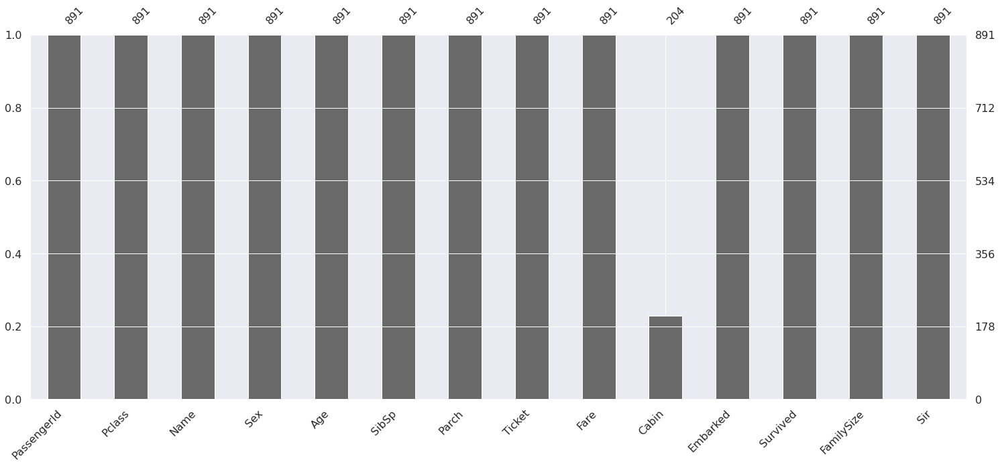

In [0]:
# %spark.pyspark
import missingno as msno

msno.bar(df=df_train.toPandas())

In [0]:
def get_age_category(age):
    return age//10
    

In [0]:
udf_get_age_category = udf(lambda age: get_age_category(age), DoubleType())

In [0]:
df_train.withColumn('Age_category', udf_get_age_category(df_train['Age'])).show()

+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+------------+
|PassengerId|Pclass|                Name|   Sex|              Age|SibSp|Parch|          Ticket|              Fare|Cabin|Embarked|Survived|FamilySize|   Sir|Age_category|
+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+------------+
|          1|     3|Braund, Mr. Owen ...|  male|             22.0|    1|    0|       A/5 21171|2.1102132003465894| null|       S|       0|         2|    Mr|         2.0|
|          2|     1|Cumings, Mrs. Joh...|female|             38.0|    1|    0|        PC 17599|   4.2805931204649|  C85|       C|       1|         2|   Mrs|         3.0|
|          3|     3|Heikkinen, Miss. ...|female|             26.0|    0|    0|STON/O2. 3101282| 2.188856327665703| null|       S|       1|         1| 

In [0]:
df_train = df_train.withColumn('Age_category', udf_get_age_category(df_train['Age']))

In [0]:
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0
6,3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0


In [0]:
#Mr, Mrs, Miss, Master, Other 총 5개로 이루어져 있습니다. 이런 카테고리로 표현되어져 있는 데이터를 모델에 인풋으로 넣어줄 때 우리가 해야할 것은 먼저 컴퓨터가 인식할 수 있도록 수치화 시켜야 합니다.

from pyspark.ml.feature import StringIndexer

In [0]:
string_indexer = StringIndexer(inputCols=['Sir'], outputCols=['Sir_category'])

In [0]:
sir_transformer = string_indexer.fit(df_train)

In [0]:
sir_transformer.labels

Out[77]: ['Mr', 'Miss', 'Mrs', 'Master', 'Other']

In [0]:
sir_transformer.transform(df_train).show()

+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+------------+------------+
|PassengerId|Pclass|                Name|   Sex|              Age|SibSp|Parch|          Ticket|              Fare|Cabin|Embarked|Survived|FamilySize|   Sir|Age_category|Sir_category|
+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+------------+------------+
|          1|     3|Braund, Mr. Owen ...|  male|             22.0|    1|    0|       A/5 21171|2.1102132003465894| null|       S|       0|         2|    Mr|         2.0|         0.0|
|          2|     1|Cumings, Mrs. Joh...|female|             38.0|    1|    0|        PC 17599|   4.2805931204649|  C85|       C|       1|         2|   Mrs|         3.0|         2.0|
|          3|     3|Heikkinen, Miss. ...|female|             26.0|    0|    0|STON/O2

In [0]:
df_train = sir_transformer.transform(df_train)

In [0]:
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0
6,3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0


In [0]:
string_indexer = StringIndexer(inputCols=['Embarked'], outputCols=['Embarked_category'])

In [0]:
embarked_transformer = string_indexer.fit(df_train)

In [0]:
embarked_transformer.labels

Out[83]: ['S', 'C', 'Q']

In [0]:
embarked_transformer.transform(df_train).show()

+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+------------+------------+-----------------+
|PassengerId|Pclass|                Name|   Sex|              Age|SibSp|Parch|          Ticket|              Fare|Cabin|Embarked|Survived|FamilySize|   Sir|Age_category|Sir_category|Embarked_category|
+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+------------+------------+-----------------+
|          1|     3|Braund, Mr. Owen ...|  male|             22.0|    1|    0|       A/5 21171|2.1102132003465894| null|       S|       0|         2|    Mr|         2.0|         0.0|              0.0|
|          2|     1|Cumings, Mrs. Joh...|female|             38.0|    1|    0|        PC 17599|   4.2805931204649|  C85|       C|       1|         2|   Mrs|         3.0|         2.0|              

In [0]:
df_train = embarked_transformer.transform(df_train)

In [0]:
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0,0.0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0,1.0
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0,0.0
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0,0.0
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0,0.0
6,3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0,2.0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0,0.0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0,0.0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0,0.0
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0,1.0


In [0]:
string_indexer = StringIndexer(inputCols=['Sex'], outputCols=['Sex_category'])

In [0]:
sex_transformer = string_indexer.fit(df_train)

In [0]:
sex_transformer.labels

Out[89]: ['male', 'female']

In [0]:
sex_transformer.transform(df_train).show()

+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+------------+------------+-----------------+------------+
|PassengerId|Pclass|                Name|   Sex|              Age|SibSp|Parch|          Ticket|              Fare|Cabin|Embarked|Survived|FamilySize|   Sir|Age_category|Sir_category|Embarked_category|Sex_category|
+-----------+------+--------------------+------+-----------------+-----+-----+----------------+------------------+-----+--------+--------+----------+------+------------+------------+-----------------+------------+
|          1|     3|Braund, Mr. Owen ...|  male|             22.0|    1|    0|       A/5 21171|2.1102132003465894| null|       S|       0|         2|    Mr|         2.0|         0.0|              0.0|         0.0|
|          2|     1|Cumings, Mrs. Joh...|female|             38.0|    1|    0|        PC 17599|   4.2805931204649|  C85|       C|       1|      

In [0]:
df_train = sex_transformer.transform(df_train)

In [0]:
display(df_train)

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category,Sex_category
1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0,0.0,0.0
2,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0,1.0,1.0
3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0,0.0,1.0
4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0,0.0,1.0
5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0,0.0,0.0
6,3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0,2.0,0.0
7,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0,0.0,0.0
8,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0,0.0,0.0
9,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0,0.0,1.0
10,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0,1.0,1.0


In [0]:
### 전처리 완료

In [0]:
### 머신러닝을 위한 컬럼 수정

df_train = df_train.drop('PassengerId')
display(df_train)

Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category,Sex_category
3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0,0.0,0.0
1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0,1.0,1.0
3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0,0.0,1.0
1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0,0.0,1.0
3,"Allen, Mr. William Henry",male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0,0.0,0.0
3,"Moran, Mr. James",male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0,2.0,0.0
1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0,0.0,0.0
3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0,0.0,0.0
3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0,0.0,1.0
2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0,1.0,1.0


In [0]:
df_train = df_train.drop('Name')
display(df_train)

Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category,Sex_category
3,male,22.0,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0,0.0,0.0
1,female,38.0,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0,1.0,1.0
3,female,26.0,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0,0.0,1.0
1,female,35.0,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0,0.0,1.0
3,male,35.0,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0,0.0,0.0
3,male,32.65158924205379,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0,2.0,0.0
1,male,54.0,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0,0.0,0.0
3,male,2.0,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0,0.0,0.0
3,female,27.0,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0,0.0,1.0
2,female,14.0,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0,1.0,1.0


In [0]:
df_train = df_train.drop('Sex')
display(df_train)

Pclass,SibSp,Parch,Fare,Survived,FamilySize,Age_category,Sir_category,Embarked_category,Sex_category
3,1,0,2.1102132003465894,0,2,2.0,0.0,0.0,0.0
1,1,0,4.2805931204649,1,2,3.0,2.0,1.0,1.0
3,0,0,2.188856327665703,1,1,2.0,1.0,0.0,1.0
1,1,0,3.9908341858524357,1,2,3.0,2.0,0.0,1.0
3,0,0,2.2027647577118348,0,1,3.0,0.0,0.0,0.0
3,0,0,2.246892662898172,0,1,3.0,0.0,2.0,0.0
1,0,0,3.967694202798607,0,1,5.0,0.0,0.0,0.0
3,3,1,3.094445746490024,0,5,0.0,3.0,0.0,0.0
3,0,2,2.4959537387180646,1,3,2.0,2.0,0.0,1.0
2,1,0,3.436268471383741,1,2,1.0,2.0,1.0,1.0


In [0]:
df_train = df_train.drop('Age')
display(df_train)

Pclass,Sex,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category,Sex_category
3,male,1,0,A/5 21171,2.1102132003465894,null,S,0,2,Mr,2.0,0.0,0.0,0.0
1,female,1,0,PC 17599,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0,1.0,1.0
3,female,0,0,STON/O2. 3101282,2.188856327665703,null,S,1,1,Miss,2.0,1.0,0.0,1.0
1,female,1,0,113803,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0,0.0,1.0
3,male,0,0,373450,2.2027647577118348,null,S,0,1,Mr,3.0,0.0,0.0,0.0
3,male,0,0,330877,2.246892662898172,null,Q,0,1,Mr,3.0,0.0,2.0,0.0
1,male,0,0,17463,3.967694202798607,E46,S,0,1,Mr,5.0,0.0,0.0,0.0
3,male,3,1,349909,3.094445746490024,null,S,0,5,Master,0.0,3.0,0.0,0.0
3,female,0,2,347742,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0,0.0,1.0
2,female,1,0,237736,3.436268471383741,null,C,1,2,Mrs,1.0,2.0,1.0,1.0


In [0]:
df_train = df_train.drop('Ticket')
display(df_train)

Pclass,Sex,SibSp,Parch,Fare,Cabin,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category,Sex_category
3,male,1,0,2.1102132003465894,null,S,0,2,Mr,2.0,0.0,0.0,0.0
1,female,1,0,4.2805931204649,C85,C,1,2,Mrs,3.0,2.0,1.0,1.0
3,female,0,0,2.188856327665703,null,S,1,1,Miss,2.0,1.0,0.0,1.0
1,female,1,0,3.9908341858524357,C123,S,1,2,Mrs,3.0,2.0,0.0,1.0
3,male,0,0,2.2027647577118348,null,S,0,1,Mr,3.0,0.0,0.0,0.0
3,male,0,0,2.246892662898172,null,Q,0,1,Mr,3.0,0.0,2.0,0.0
1,male,0,0,3.967694202798607,E46,S,0,1,Mr,5.0,0.0,0.0,0.0
3,male,3,1,3.094445746490024,null,S,0,5,Master,0.0,3.0,0.0,0.0
3,female,0,2,2.4959537387180646,null,S,1,3,Mrs,2.0,2.0,0.0,1.0
2,female,1,0,3.436268471383741,null,C,1,2,Mrs,1.0,2.0,1.0,1.0


In [0]:
df_train = df_train.drop('Cabin')
display(df_train)

Pclass,Sex,SibSp,Parch,Fare,Embarked,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category,Sex_category
3,male,1,0,2.1102132003465894,S,0,2,Mr,2.0,0.0,0.0,0.0
1,female,1,0,4.2805931204649,C,1,2,Mrs,3.0,2.0,1.0,1.0
3,female,0,0,2.188856327665703,S,1,1,Miss,2.0,1.0,0.0,1.0
1,female,1,0,3.9908341858524357,S,1,2,Mrs,3.0,2.0,0.0,1.0
3,male,0,0,2.2027647577118348,S,0,1,Mr,3.0,0.0,0.0,0.0
3,male,0,0,2.246892662898172,Q,0,1,Mr,3.0,0.0,2.0,0.0
1,male,0,0,3.967694202798607,S,0,1,Mr,5.0,0.0,0.0,0.0
3,male,3,1,3.094445746490024,S,0,5,Master,0.0,3.0,0.0,0.0
3,female,0,2,2.4959537387180646,S,1,3,Mrs,2.0,2.0,0.0,1.0
2,female,1,0,3.436268471383741,C,1,2,Mrs,1.0,2.0,1.0,1.0


In [0]:
df_train = df_train.drop('Embarked')
display(df_train)

Pclass,Sex,SibSp,Parch,Fare,Survived,FamilySize,Sir,Age_category,Sir_category,Embarked_category,Sex_category
3,male,1,0,2.1102132003465894,0,2,Mr,2.0,0.0,0.0,0.0
1,female,1,0,4.2805931204649,1,2,Mrs,3.0,2.0,1.0,1.0
3,female,0,0,2.188856327665703,1,1,Miss,2.0,1.0,0.0,1.0
1,female,1,0,3.9908341858524357,1,2,Mrs,3.0,2.0,0.0,1.0
3,male,0,0,2.2027647577118348,0,1,Mr,3.0,0.0,0.0,0.0
3,male,0,0,2.246892662898172,0,1,Mr,3.0,0.0,2.0,0.0
1,male,0,0,3.967694202798607,0,1,Mr,5.0,0.0,0.0,0.0
3,male,3,1,3.094445746490024,0,5,Master,0.0,3.0,0.0,0.0
3,female,0,2,2.4959537387180646,1,3,Mrs,2.0,2.0,0.0,1.0
2,female,1,0,3.436268471383741,1,2,Mrs,1.0,2.0,1.0,1.0


In [0]:
df_train = df_train.drop('Sir')
display(df_train)

Pclass,Sex,SibSp,Parch,Fare,Survived,FamilySize,Age_category,Sir_category,Embarked_category,Sex_category
3,male,1,0,2.1102132003465894,0,2,2.0,0.0,0.0,0.0
1,female,1,0,4.2805931204649,1,2,3.0,2.0,1.0,1.0
3,female,0,0,2.188856327665703,1,1,2.0,1.0,0.0,1.0
1,female,1,0,3.9908341858524357,1,2,3.0,2.0,0.0,1.0
3,male,0,0,2.2027647577118348,0,1,3.0,0.0,0.0,0.0
3,male,0,0,2.246892662898172,0,1,3.0,0.0,2.0,0.0
1,male,0,0,3.967694202798607,0,1,5.0,0.0,0.0,0.0
3,male,3,1,3.094445746490024,0,5,0.0,3.0,0.0,0.0
3,female,0,2,2.4959537387180646,1,3,2.0,2.0,0.0,1.0
2,female,1,0,3.436268471383741,1,2,1.0,2.0,1.0,1.0


In [0]:
# PassengerId, Name, Ticket, Age, Cabin, Sex Embarked, Sir 컬럼 삭제


In [0]:
columns = df_train.columns
columns

Out[104]: ['Pclass',
 'SibSp',
 'Parch',
 'Fare',
 'Survived',
 'FamilySize',
 'Age_category',
 'Sir_category',
 'Embarked_category',
 'Sex_category']

In [0]:
# 종속 변수 삭제
columns.remove('Survived')


In [0]:
columns

Out[106]: ['Pclass',
 'SibSp',
 'Parch',
 'Fare',
 'FamilySize',
 'Age_category',
 'Sir_category',
 'Embarked_category',
 'Sex_category']

In [0]:
from pyspark.ml.feature import VectorAssembler

assembler = VectorAssembler(inputCols=columns, outputCol='Features')

In [0]:
asembler_df = assembler.transform(df_train)

In [0]:
display(asembler_df.show())

+------+-----+-----+------------------+--------+----------+------------+------------+-----------------+------------+--------------------+
|Pclass|SibSp|Parch|              Fare|Survived|FamilySize|Age_category|Sir_category|Embarked_category|Sex_category|            Features|
+------+-----+-----+------------------+--------+----------+------------+------------+-----------------+------------+--------------------+
|     3|    1|    0|2.1102132003465894|       0|         2|         2.0|         0.0|              0.0|         0.0|[3.0,1.0,0.0,2.11...|
|     1|    1|    0|   4.2805931204649|       1|         2|         3.0|         2.0|              1.0|         1.0|[1.0,1.0,0.0,4.28...|
|     3|    0|    0| 2.188856327665703|       1|         1|         2.0|         1.0|              0.0|         1.0|[3.0,0.0,0.0,2.18...|
|     1|    1|    0|3.9908341858524357|       1|         2|         3.0|         2.0|              0.0|         1.0|[1.0,1.0,0.0,3.99...|
|     3|    0|    0|2.202764757711

In [0]:
(trainingData, testData) = asembler_df.randomSplit([0.7, 0.3])

In [0]:
display(trainingData)

Pclass,SibSp,Parch,Fare,Survived,FamilySize,Age_category,Sir_category,Embarked_category,Sex_category,Features
1,0,0,0.0,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 4, 5), values -> List(1.0, 1.0, 3.0))"
1,0,0,0.0,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 4, 5), values -> List(1.0, 1.0, 3.0))"
1,0,0,0.0,0,1,3.0,4.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 4, 5, 6), values -> List(1.0, 1.0, 3.0, 4.0))"
1,0,0,0.0,0,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 4, 5), values -> List(1.0, 1.0, 4.0))"
1,0,0,3.2804411805263554,0,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.2804411805263554, 1.0, 4.0))"
1,0,0,3.2930552230424524,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.2930552230424524, 1.0, 3.0))"
1,0,0,3.2932111997353943,1,1,4.0,0.0,0.0,1.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.2932111997353943, 1.0, 4.0, 0.0, 0.0, 1.0))"
1,0,0,3.295836866004329,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.295836866004329, 1.0, 3.0))"
1,0,0,3.295836866004329,0,1,6.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.295836866004329, 1.0, 6.0))"
1,0,0,3.3064287218760624,1,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3064287218760624, 1.0, 3.0))"


In [0]:
display(testData)

Pclass,SibSp,Parch,Fare,Survived,FamilySize,Age_category,Sir_category,Embarked_category,Sex_category,Features
1,0,0,0.0,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 4, 5), values -> List(1.0, 1.0, 3.0))"
1,0,0,1.791759469228055,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 1.791759469228055, 1.0, 3.0))"
1,0,0,3.2932111997353943,1,1,4.0,2.0,0.0,1.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.2932111997353943, 1.0, 4.0, 2.0, 0.0, 1.0))"
1,0,0,3.3064287218760624,1,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3064287218760624, 1.0, 3.0))"
1,0,0,3.3064287218760624,1,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3064287218760624, 1.0, 4.0))"
1,0,0,3.3160025355989236,0,1,6.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3160025355989236, 1.0, 6.0))"
1,0,0,3.3160025355989236,0,1,6.0,4.0,0.0,0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.3160025355989236, 1.0, 6.0, 4.0, 0.0, 0.0))"
1,0,0,3.3160025355989236,1,1,5.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3160025355989236, 1.0, 5.0))"
1,0,0,3.357621598945279,0,1,4.0,0.0,1.0,0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.357621598945279, 1.0, 4.0, 0.0, 1.0, 0.0))"
1,0,0,3.3843902633457743,0,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3843902633457743, 1.0, 4.0))"


In [0]:
from pyspark.ml.classification import RandomForestClassifier

rf = RandomForestClassifier(featuresCol = 'Features', labelCol = 'Survived', numTrees=100)

In [0]:
rfModel = rf.fit(trainingData)

In [0]:
rfModel

Out[118]: RandomForestClassificationModel: uid=RandomForestClassifier_4aa6bce7f048, numTrees=100, numClasses=2, numFeatures=9

In [0]:
rf_prediction = rfModel.transform(testData)

In [0]:
display(rf_prediction)

Pclass,SibSp,Parch,Fare,Survived,FamilySize,Age_category,Sir_category,Embarked_category,Sex_category,Features,rawPrediction,probability,prediction
1,0,0,0.0,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 4, 5), values -> List(1.0, 1.0, 3.0))","Map(vectorType -> dense, length -> 2, values -> List(80.62136452243232, 19.378635477567684))","Map(vectorType -> dense, length -> 2, values -> List(0.8062136452243231, 0.19378635477567685))",0.0
1,0,0,1.791759469228055,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 1.791759469228055, 1.0, 3.0))","Map(vectorType -> dense, length -> 2, values -> List(80.62136452243232, 19.378635477567684))","Map(vectorType -> dense, length -> 2, values -> List(0.8062136452243231, 0.19378635477567685))",0.0
1,0,0,3.2932111997353943,1,1,4.0,2.0,0.0,1.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.2932111997353943, 1.0, 4.0, 2.0, 0.0, 1.0))","Map(vectorType -> dense, length -> 2, values -> List(7.422939176076881, 92.57706082392309))","Map(vectorType -> dense, length -> 2, values -> List(0.07422939176076883, 0.9257706082392312))",1.0
1,0,0,3.3064287218760624,1,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3064287218760624, 1.0, 3.0))","Map(vectorType -> dense, length -> 2, values -> List(65.09897436108902, 34.90102563891096))","Map(vectorType -> dense, length -> 2, values -> List(0.6509897436108903, 0.3490102563891097))",0.0
1,0,0,3.3064287218760624,1,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3064287218760624, 1.0, 4.0))","Map(vectorType -> dense, length -> 2, values -> List(66.9073072814313, 33.09269271856867))","Map(vectorType -> dense, length -> 2, values -> List(0.6690730728143132, 0.3309269271856868))",0.0
1,0,0,3.3160025355989236,0,1,6.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3160025355989236, 1.0, 6.0))","Map(vectorType -> dense, length -> 2, values -> List(71.77625440972643, 28.223745590273534))","Map(vectorType -> dense, length -> 2, values -> List(0.7177625440972646, 0.2822374559027354))",0.0
1,0,0,3.3160025355989236,0,1,6.0,4.0,0.0,0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.3160025355989236, 1.0, 6.0, 4.0, 0.0, 0.0))","Map(vectorType -> dense, length -> 2, values -> List(68.07451813391248, 31.92548186608749))","Map(vectorType -> dense, length -> 2, values -> List(0.680745181339125, 0.319254818660875))",0.0
1,0,0,3.3160025355989236,1,1,5.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3160025355989236, 1.0, 5.0))","Map(vectorType -> dense, length -> 2, values -> List(71.33439394461017, 28.665606055389812))","Map(vectorType -> dense, length -> 2, values -> List(0.7133439394461017, 0.28665606055389814))",0.0
1,0,0,3.357621598945279,0,1,4.0,0.0,1.0,0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.357621598945279, 1.0, 4.0, 0.0, 1.0, 0.0))","Map(vectorType -> dense, length -> 2, values -> List(65.93438369275628, 34.065616307243694))","Map(vectorType -> dense, length -> 2, values -> List(0.659343836927563, 0.340656163072437))",0.0
1,0,0,3.3843902633457743,0,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3843902633457743, 1.0, 4.0))","Map(vectorType -> dense, length -> 2, values -> List(66.9073072814313, 33.09269271856867))","Map(vectorType -> dense, length -> 2, values -> List(0.6690730728143132, 0.3309269271856868))",0.0


In [0]:
display(rf_prediction['survived', 'prediction'])

survived,prediction
0,0.0
0,0.0
1,1.0
1,0.0
1,0.0
0,0.0
0,0.0
1,0.0
0,0.0
0,0.0


In [0]:
right_predict = rf_prediction.filter ( rf_prediction.Survived == rf_prediction.prediction)
display(right_predict)

Pclass,SibSp,Parch,Fare,Survived,FamilySize,Age_category,Sir_category,Embarked_category,Sex_category,Features,rawPrediction,probability,prediction
1,0,0,0.0,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 4, 5), values -> List(1.0, 1.0, 3.0))","Map(vectorType -> dense, length -> 2, values -> List(80.62136452243232, 19.378635477567684))","Map(vectorType -> dense, length -> 2, values -> List(0.8062136452243231, 0.19378635477567685))",0.0
1,0,0,1.791759469228055,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 1.791759469228055, 1.0, 3.0))","Map(vectorType -> dense, length -> 2, values -> List(80.62136452243232, 19.378635477567684))","Map(vectorType -> dense, length -> 2, values -> List(0.8062136452243231, 0.19378635477567685))",0.0
1,0,0,3.2932111997353943,1,1,4.0,2.0,0.0,1.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.2932111997353943, 1.0, 4.0, 2.0, 0.0, 1.0))","Map(vectorType -> dense, length -> 2, values -> List(7.422939176076881, 92.57706082392309))","Map(vectorType -> dense, length -> 2, values -> List(0.07422939176076883, 0.9257706082392312))",1.0
1,0,0,3.3160025355989236,0,1,6.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3160025355989236, 1.0, 6.0))","Map(vectorType -> dense, length -> 2, values -> List(71.77625440972643, 28.223745590273534))","Map(vectorType -> dense, length -> 2, values -> List(0.7177625440972646, 0.2822374559027354))",0.0
1,0,0,3.3160025355989236,0,1,6.0,4.0,0.0,0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.3160025355989236, 1.0, 6.0, 4.0, 0.0, 0.0))","Map(vectorType -> dense, length -> 2, values -> List(68.07451813391248, 31.92548186608749))","Map(vectorType -> dense, length -> 2, values -> List(0.680745181339125, 0.319254818660875))",0.0
1,0,0,3.357621598945279,0,1,4.0,0.0,1.0,0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.357621598945279, 1.0, 4.0, 0.0, 1.0, 0.0))","Map(vectorType -> dense, length -> 2, values -> List(65.93438369275628, 34.065616307243694))","Map(vectorType -> dense, length -> 2, values -> List(0.659343836927563, 0.340656163072437))",0.0
1,0,0,3.3843902633457743,0,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3843902633457743, 1.0, 4.0))","Map(vectorType -> dense, length -> 2, values -> List(66.9073072814313, 33.09269271856867))","Map(vectorType -> dense, length -> 2, values -> List(0.6690730728143132, 0.3309269271856868))",0.0
1,0,0,3.4339872044851463,0,1,2.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.4339872044851463, 1.0, 2.0))","Map(vectorType -> dense, length -> 2, values -> List(61.06649565135857, 38.93350434864142))","Map(vectorType -> dense, length -> 2, values -> List(0.6106649565135858, 0.38933504348641423))",0.0
1,0,0,3.4561841799918147,0,1,3.0,0.0,1.0,0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.4561841799918147, 1.0, 3.0, 0.0, 1.0, 0.0))","Map(vectorType -> dense, length -> 2, values -> List(62.89863104552965, 37.10136895447033))","Map(vectorType -> dense, length -> 2, values -> List(0.6289863104552966, 0.37101368954470343))",0.0
1,0,0,3.5061818266142577,0,1,6.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.5061818266142577, 1.0, 6.0))","Map(vectorType -> dense, length -> 2, values -> List(72.84563370491983, 27.154366295080134))","Map(vectorType -> dense, length -> 2, values -> List(0.7284563370491985, 0.2715436629508014))",0.0


In [0]:
display(right_predict['survived','prediction'])

survived,prediction
0,0.0
0,0.0
1,1.0
0,0.0
0,0.0
0,0.0
0,0.0
0,0.0
0,0.0
0,0.0


In [0]:
right_predict.count()

Out[125]: 211

In [0]:
rf_prediction.count()

Out[126]: 252

In [0]:
right_predict.count() / rf_prediction.count()

Out[127]: 0.8373015873015873

In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

evaluator_accuracy = MulticlassClassificationEvaluator(labelCol='Survived', predictionCol='prediction', metricName='accuracy')

In [0]:
evaluator_accuracy.evaluate(rf_prediction)

Out[130]: 0.8373015873015873

In [0]:
dataset = trainingData.toPandas()
dataset

,Pclass,SibSp,Parch,Fare,Survived,FamilySize,Age_category,Sir_category,Embarked_category,Sex_category,Features
0,1,0,0,0.000000,0,1,3.0,0.0,0.0,0.0,"(1.0, 0.0, 0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0)"
1,1,0,0,0.000000,0,1,3.0,0.0,0.0,0.0,"(1.0, 0.0, 0.0, 0.0, 1.0, 3.0, 0.0, 0.0, 0.0)"
2,1,0,0,0.000000,0,1,3.0,4.0,0.0,0.0,"(1.0, 0.0, 0.0, 0.0, 1.0, 3.0, 4.0, 0.0, 0.0)"
3,1,0,0,0.000000,0,1,4.0,0.0,0.0,0.0,"(1.0, 0.0, 0.0, 0.0, 1.0, 4.0, 0.0, 0.0, 0.0)"
4,1,0,0,3.280441,0,1,4.0,0.0,0.0,0.0,"(1.0, 0.0, 0.0, 3.2804411805263554, 1.0, 4.0, ..."
...,...,...,...,...,...,...,...,...,...,...,...
634,3,8,2,4.256322,0,11,2.0,1.0,0.0,1.0,"[3.0, 8.0, 2.0, 4.256321678298823, 11.0, 2.0, ..."
635,3,8,2,4.256322,0,11,2.0,1.0,0.0,1.0,"[3.0, 8.0, 2.0, 4.256321678298823, 11.0, 2.0, ..."
636,3,8,2,4.256322,0,11,3.0,0.0,0.0,0.0,"[3.0, 8.0, 2.0, 4.256321678298823, 11.0, 3.0, ..."
637,3,8,2,4.256322,0,11,3.0,0.0,0.0,0.0,"[3.0, 8.0, 2.0, 4.256321678298823, 11.0, 3.0, ..."


In [0]:
dataset = dataset[columns + ['Survived']]
dataset

,Pclass,SibSp,Parch,Fare,FamilySize,Age_category,Sir_category,Embarked_category,Sex_category,Survived
0,1,0,0,0.000000,1,3.0,0.0,0.0,0.0,0
1,1,0,0,0.000000,1,3.0,0.0,0.0,0.0,0
2,1,0,0,0.000000,1,3.0,4.0,0.0,0.0,0
3,1,0,0,0.000000,1,4.0,0.0,0.0,0.0,0
4,1,0,0,3.280441,1,4.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...
634,3,8,2,4.256322,11,2.0,1.0,0.0,1.0,0
635,3,8,2,4.256322,11,2.0,1.0,0.0,1.0,0
636,3,8,2,4.256322,11,3.0,0.0,0.0,0.0,0
637,3,8,2,4.256322,11,3.0,0.0,0.0,0.0,0


In [0]:
import dtreeviz

viz_model = dtreeviz.model( 
                           rfModel.trees[99], # RandomForest의 99번째 Decision Tree 객체
                           
                           X_train = dataset[columns],
                           y_train = dataset['Survived'],

                           feature_names=columns,
                           target_name='Survived',
                           class_names=['dead', 'survived']
)

In [0]:
v = viz_model.view().svg()

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


In [0]:
displayHTML(v)

G 
 
 
 cluster_legend 
 

 
 node3 
 
 
 
 
 
 2023-10-13T03:01:15.786329 
 image/svg+xml 
 
 
 Matplotlib v3.4.2, https://matplotlib.org/ 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <path d="M 2597 2516 Q 3050 2419 3304 2112 Q 3559 1806 3559 1356 Q 3559 666 3084 287 Q 2609 -91 1734 -91 Q 1441 -91 1130 -33 Q 819 25 488 141 L 488 750 Q 750 597 1062 519 Q 1375 441 1716 441 Q 2309 441 2620 675 Q 2931 909 2931 1356 Q 2931 1769 2642 2001 Q 2353 2234 1838 2234 L 1294 2234 L 1294 2753 L 1863 2753 Q 2328 2753 2575 2939 Q 2822 3125 2822 3475 Q 2822 3834 2567 4026 Q 2313 4219 1838 4219 Q 1578 4219 1281 4162 Q 984 4106 628 3988 L 628 4550 Q 988 4650 1302 4700 Q 1616 4750 1894 4750 Q 2613 4750 3031 4423 Q 3450 4097 3450 3541 Q 3450 3153 3228 2886 Q 3006 2619 2597 2516 z " id="DejaVuSans-33" transform="scale(0.015625)" />
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <path d="M 2194 1759 Q 1497 1759 1228 1600 Q 959 1441 959 1056 Q 959 750 1161 570 Q 1363 391 1709 391 Q 2188 391 2477 730 Q 2766 1069 2766 1631 L 2766 1759 L 2194 1759 z M 3341 1997 L 3341 0 L 2766 0 L 2766 531 Q 2569 213 2275 61 Q 1981 -91 1556 -91 Q 1019 -91 701 211 Q 384 513 384 1019 Q 384 1609 779 1909 Q 1175 2209 1959 2209 L 2766 2209 L 2766 2266 Q 2766 2663 2505 2880 Q 2244 3097 1772 3097 Q 1472 3097 1187 3025 Q 903 2953 641 2809 L 641 3341 Q 956 3463 1253 3523 Q 1550 3584 1831 3584 Q 2591 3584 2966 3190 Q 3341 2797 3341 1997 z " id="DejaVuSans-61" transform="scale(0.015625)" />
 <path d="M 2834 3397 L 2834 2853 Q 2591 2978 2328 3040 Q 2066 3103 1784 3103 Q 1356 3103 1142 2972 Q 928 2841 928 2578 Q 928 2378 1081 2264 Q 1234 2150 1697 2047 L 1894 2003 Q 2506 1872 2764 1633 Q 3022 1394 3022 966 Q 3022 478 2636 193 Q 2250 -91 1575 -91 Q 1294 -91 989 -36 Q 684 19 347 128 L 347 722 Q 666 556 975 473 Q 1284 391 1588 391 Q 1994 391 2212 530 Q 2431 669 2431 922 Q 2431 1156 2273 1281 Q 2116 1406 1581 1522 L 1381 1569 Q 847 1681 609 1914 Q 372 2147 372 2553 Q 372 3047 722 3315 Q 1072 3584 1716 3584 Q 2034 3584 2315 3537 Q 2597 3491 2834 3397 z " id="DejaVuSans-73" transform="scale(0.015625)" />
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 

 
 leaf4 
 
 
 
 
 
 
 2023-10-13T03:01:18.995760 
 image/svg+xml 
 
 
 Matplotlib v3.4.2, https://matplotlib.org/ 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <path d="M 16.978156 5.738 C 16.978156 4.984493 16.829732 4.238312 16.541377 3.542162 C 16.253022 2.846013 15.830345 2.213431 15.297535 1.680621 C 14.764725 1.147811 14.132144 0.725134 13.435994 0.436779 C 12.739844 0.148424 11.993664 0 11.240156 0 C 10.486649 0 9.740469 0.148424 9.044319 0.436779 C 8.348169 0.725134 7.715588 1.147811 7.182778 1.680621 C 6.649967 2.213431 6.22729 2.846013 5.938935 3.542162 C 5.650581 4.238312 5.502156 4.984493 5.502156 5.738 C 5.502156 6.491507 5.650581 7.237688 5.938935 7.933838 C 6.22729 8.629987 6.649967 9.262569 7.182778 9.795379 C 7.715588 10.328189 8.348169 10.750866 9.044319 11.039221 C 9.740469 11.327576 10.486649 11.476 11.240156 11.476 C 11.993664 11.476 12.739844 11.327576 13.435994 11.039221 C 14.132144 10.750866 14.764725 10.328189 15.297535 9.795379 C 15.830345 9.262569 16.253022 8.629987 16.541377 7.933838 C 16.829732 7.237688 16.978156 6.491507 16.978156 5.738 M 11.240156 5.738 M 16.978156 5.738 z " style="fill:#fefebb;stroke:#444443;stroke-linejoin:miter;stroke-width:0.5;" />
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <path d="M 2194 1759 Q 1497 1759 1228 1600 Q 959 1441 959 1056 Q 959 750 1161 570 Q 1363 391 1709 391 Q 2188 391 2477 730 Q 2766 1069 2766 1631 L 2766 1759 L 2194 1759 z M 3341 1997 L 3341 0 L 2766 0 L 2766 531 Q 2569 213 2275 61 Q 1981 -91 1556 -91 Q 1019 -91 701 211 Q 384 513 384 1019 Q 384 1609 779 1909 Q 1175 2209 1959 2209 L 2766 2

In [0]:
from sparkdl.xgboost import XgboostClassifier

xgb_classifier = XgboostClassifier(featuresCol='features', #독립변수 저장된 칸
                                   labelCol='Survived', #종속변수가 저장된 칸
                                   n_estimators=500, #decision tree의 개수
                                   missing=0.0) #결측치를 치환할 값 예에서는 결측치를 0으로 치환, 
                                                #XGboost는 결측치가 있으면 자동으로 다른값으로 치환되기 
                                                #때문에 결측치가 있어도 머신러닝 사용 가능

In [0]:
xgb_model = xgb_classifier.fit(trainingData)

In [0]:
xgb_predictions = xgb_model.transform(testData)
display(xgb_predictions)

Pclass,SibSp,Parch,Fare,Survived,FamilySize,Age_category,Sir_category,Embarked_category,Sex_category,Features,rawPrediction,prediction,probability
1,0,0,0.0,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 4, 5), values -> List(1.0, 1.0, 3.0))","Map(vectorType -> dense, length -> 2, values -> List(19.933303833007812, -19.933303833007812))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(1.0, 2.203312643445088E-9))"
1,0,0,1.791759469228055,0,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 1.791759469228055, 1.0, 3.0))","Map(vectorType -> dense, length -> 2, values -> List(5.245778560638428, -5.245778560638428))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.994757890701294, 0.005242093000560999))"
1,0,0,3.2932111997353943,1,1,4.0,2.0,0.0,1.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.2932111997353943, 1.0, 4.0, 2.0, 0.0, 1.0))","Map(vectorType -> dense, length -> 2, values -> List(-6.301822662353516, 6.301822662353516))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(0.0018296241760253906, 0.9981703758239746))"
1,0,0,3.3064287218760624,1,1,3.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3064287218760624, 1.0, 3.0))","Map(vectorType -> dense, length -> 2, values -> List(-3.160750150680542, 3.160750150680542))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(0.040669798851013184, 0.9593302011489868))"
1,0,0,3.3064287218760624,1,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3064287218760624, 1.0, 4.0))","Map(vectorType -> dense, length -> 2, values -> List(-1.6202619075775146, 1.6202619075775146))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(0.16516876220703125, 0.8348312377929688))"
1,0,0,3.3160025355989236,0,1,6.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3160025355989236, 1.0, 6.0))","Map(vectorType -> dense, length -> 2, values -> List(4.116917610168457, -4.116917610168457))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.983966588973999, 0.01603340543806553))"
1,0,0,3.3160025355989236,0,1,6.0,4.0,0.0,0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.3160025355989236, 1.0, 6.0, 4.0, 0.0, 0.0))","Map(vectorType -> dense, length -> 2, values -> List(2.7339389324188232, -2.7339389324188232))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.9389998316764832, 0.06100014969706535))"
1,0,0,3.3160025355989236,1,1,5.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3160025355989236, 1.0, 5.0))","Map(vectorType -> dense, length -> 2, values -> List(5.49381685256958, -5.49381685256958))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.9959047436714172, 0.0040952786803245544))"
1,0,0,3.357621598945279,0,1,4.0,0.0,1.0,0.0,"Map(vectorType -> dense, length -> 9, values -> List(1.0, 0.0, 0.0, 3.357621598945279, 1.0, 4.0, 0.0, 1.0, 0.0))","Map(vectorType -> dense, length -> 2, values -> List(2.706488609313965, -2.706488609313965))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.937408447265625, 0.0625915601849556))"
1,0,0,3.3843902633457743,0,1,4.0,0.0,0.0,0.0,"Map(vectorType -> sparse, length -> 9, indices -> List(0, 3, 4, 5), values -> List(1.0, 3.3843902633457743, 1.0, 4.0))","Map(vectorType -> dense, length -> 2, values -> List(2.609926462173462, -2.609926462173462))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.9314976930618286, 0.06850229203701019))"


In [0]:
acc_eval = MulticlassClassificationEvaluator(labelCol='Survived', predictionCol='prediction', metricName='accuracy')

In [0]:
acc_eval.evaluate(xgb_predictions)

Out[142]: 0.8055555555555556

In [0]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

search_space = { 
                'max_depth': hp.quniform('max_depth', 3, 20, 1),

                'min_child_weight': hp.quniform('min_child_weight', 3, 20, 1),
                'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),

                'learning_rate': hp.uniform('learning_rate', 0.01, 0.5)
}

In [0]:
def objective_func(space):
    xgb_classifier = XgboostClassifier(featuresCol='features',
                                    labelCol='Survived',
                                    n_estimators=500,
                                    missing=0.0,
                                    num_works=3,
                                    max_depth=int(space['max_depth']),
                                    min_child_weight=int(space['min_child_weight']),
                                    colsample_bytree = space['colsample_bytree'],
                                    learning_rate=space['learning_rate'])
    xgb_model = xgb_classifier.fit(trainingData)

    xgb_predictions = xgb_model.transform(testData)

    accuracy = acc_eval.evaluate(xgb_predictions)

    print('space=', space, 'accuracy=', accuracy)
    print('='*100)
    return {'loss': -1*accuracy, 'status':STATUS_OK}
    

In [0]:
algo = tpe.suggest

trials = Trials()
best = fmin(fn=objective_func, space=search_space, max_evals=100, algo=algo, trials=trials)

space=
{'colsample_bytree': 0.7146494696898817, 'learning_rate': 0.4311678666593086, 'max_depth': 10.0, 'min_child_weight': 16.0}
accuracy=
0.8253968253968254
space=
{'colsample_bytree': 0.6708501346064537, 'learning_rate': 0.04581257323114873, 'max_depth': 6.0, 'min_child_weight': 17.0}
accuracy=
0.8214285714285714
space=
{'colsample_bytree': 0.5466753648380089, 'learning_rate': 0.4058542255857221, 'max_depth': 5.0, 'min_child_weight': 7.0}
accuracy=
0.8134920634920635
space=
{'colsample_bytree': 0.7634490727482356, 'learning_rate': 0.4283419842907723, 'max_depth': 19.0, 'min_child_weight': 6.0}
accuracy=
0.8174603174603174
space=
{'colsample_bytree': 0.8290033337516679, 'learning_rate': 0.1708655148129297, 'max_depth': 5.0, 'min_child_weight': 8.0}
accuracy=
0.8095238095238095
space=
{'colsample_bytree': 0.71176171312383, 'learning_rate': 0.3767590767143618, 'max_depth': 6.0, 'min_child_weight': 17.0}
accuracy=
0.8293650793650794
space=
{'colsample_bytree': 0.7672104522790064, 'learn

In [0]:
best

In [0]:
xgb_best = XgboostClassifier(featuresCol='features',
                                labelCol='Survived',
                                n_estimators=500,
                                missing=0.0,
                                num_works=3,
                                max_depth=int(best['max_depth']),
                                min_child_weight=int(best['min_child_weight']),
                                colsample_bytree = best['colsample_bytree'],
                                learning_rate=best['learning_rate'])

In [0]:
xgb_model = xgb_best.fit(trainingData)

xgb_predictions = xgb_model.transform(testData)

accuracy = acc_eval.evaluate(xgb_predictions)
print('accuracy = ', accuracy)